# 프로젝트 : 개선된 U-Net 모델 만들기

Step 1. KITTI 데이터셋 수집과 구축

Step 2. U-Net++ 모델의 구현

Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석

In [86]:
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

# import tensorflow.keras.backend as K
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.metrics import MeanIoU, BinaryAccuracy, Precision, Recall

from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

# Step 1. KITTI 데이터셋 수집과 구축

In [2]:
def build_augmentation(is_train=True):
    if is_train:    # 훈련용 데이터일 경우
        return Compose([
                        HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                        RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                            min_max_height=(300, 370),
                            w2h_ratio=370/1242,
                            height=224,
                            width=224,
                            p=0.5
                            ),
                        Resize(              # 입력이미지를 224X224로 resize
                            width=224,
                            height=224
                            )
                        ])
    # 테스트용 데이터일 경우에는 224X224로 resize만 수행
    return Compose([Resize(width=224, height=224)])

class KittiGenerator(tf.keras.utils.Sequence):
    '''
    KittiDataset을 원하는 방식으로 preprocess하기 위해
    Sequnce를 커스텀하여 사용.
    '''
    def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
        '''
        dir_path: dataset의 경로
        img_size: preprocess에 사용할 입력이미지의 크기
        output_size: ground_truth를 만들어주기 위한 크기
        is_train: 이 Generator가 학습용인지 테스트용인지 구분
        augmentation: 적용하길 원하는 augmentation 함수
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수
        # is_train에 따라 test set을 분리해서 load
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-30]
        return data[-30:]

    def __len__(self):
        # Generator의 length
        # 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
        # 입력과 출력 생성
        # 입력은 resize및 augmentation이 적용된 input image
        # 출력은 semantic label
        batch_data = self.data[
                               index*self.batch_size:
                               (index + 1)*self.batch_size
                               ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])

        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            _output = (_output==7).astype(np.uint8)*1
            data = {"image": _input,
                    "mask": _output}
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
        return inputs, outputs

    def on_epoch_end(self):
        # 한 epoch가 끝나면 실행되는 함수입니다.
        # 학습중인 경우에 순서를 random shuffle하도록 적용
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
            return self.indexes

In [3]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)

train_generator = KittiGenerator(dir_path, augmentation=augmentation)
test_generator = KittiGenerator(dir_path, augmentation=test_preproc, is_train=False)

# Step 2. U-Net++ 모델의 구현

In [4]:
def conv_block(x, num_filters, pool=False, skip_connection=None):
    if skip_connection:
        x = Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(x)
        x = concatenate(skip_connection + [x], axis=-1)
        
    x = Conv2D(num_filters, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(x)
    x = Conv2D(num_filters, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(x)
    
    if pool: 
        p = MaxPooling2D(pool_size=(2, 2))(x)
        return x, p
    return x

def build_unet(input_shape=(224, 224, 3)):
    image_input = Input(shape=input_shape, name='input_image')
    
    # Encoder (나중에 디코더에서 합쳐주기 위해 넘버링 필요)
    conv1, p1 = conv_block(image_input, 64, True)  
    conv2, p2 = conv_block(p1, 128, True)    
    conv3, p3 = conv_block(p2, 256, True)
    conv4, p4 = conv_block(p3, 512, True)
    
    # 전환점
    conv5 = conv_block(p4, 1024)
    
    # Decoder
    upconv4 = conv_block(conv5, 512, skip_connection=[conv4])
    upconv3 = conv_block(upconv4, 256, skip_connection=[conv3])
    upconv2 = conv_block(upconv3, 128, skip_connection=[conv2])
    upconv1 = conv_block(upconv2, 64, skip_connection=[conv1])
    
    # output
    output = Conv2D(1, (1, 1), activation='sigmoid')(upconv1)

    # Model
    model = Model(inputs=image_input, outputs=output)
    
    return model

def build_unetpp(input_shape=(224, 224, 3), deep_supervision=False):
 
    image_input = Input(shape=input_shape, name='input_image')
    
    # Encoder (나중에 디코더에서 합쳐주기 위해 넘버링 필요)
    x00, p1 = conv_block(image_input, 64, True)  
    x10, p2 = conv_block(p1, 128, True)    
    x20, p3 = conv_block(p2, 256, True)
    x30, p4 = conv_block(p3, 512, True)
    
    # 전환점
    x40 = conv_block(p4, 1024)
    
    # Decoder
    x01 = conv_block(x10, 64, skip_connection=[x00])
    x11 = conv_block(x20, 128, skip_connection=[x10])
    x21 = conv_block(x30, 256, skip_connection=[x20])
    x31 = conv_block(x40, 512, skip_connection=[x30])
    
    x02 = conv_block(x11, 64, skip_connection=[x00, x01])
    x12 = conv_block(x21, 128, skip_connection=[x10, x11])
    x22 = conv_block(x31, 256, skip_connection=[x20, x21])
    
    x03 = conv_block(x12, 64, skip_connection=[x00, x01, x02])
    x13 = conv_block(x22, 128, skip_connection=[x10, x11, x12])
    
    x04 = conv_block(x13, 64, skip_connection=[x00, x01, x02, x03])
    
    # outputs
    output_1 = Conv2D(1, (1, 1), activation='sigmoid', name='output_1')(x01)
    output_2 = Conv2D(1, (1, 1), activation='sigmoid', name='output_2')(x02)
    output_3 = Conv2D(1, (1, 1), activation='sigmoid', name='output_3')(x03)
    output_4 = Conv2D(1, (1, 1), activation='sigmoid', name='output_4')(x04)
    outputs = [output_1, output_2, output_3, output_4]
    
    # Model
    model = Model(inputs=image_input,
                  outputs=outputs if deep_supervision else [output_4])
    
    return model

In [5]:
def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = tf.reshape(y_true, [-1]) # K.flatten(y_true)
    y_pred_f = tf.reshape(y_pred, [-1]) # K.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f) # K.sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) # (K.sum(y_true_f) + K.sum(y_pred_f)
    return (2. * intersection + smooth) / (union + smooth)

# def dice_coef_loss(y_true, y_pred):
#     return 1. - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    dice_loss = 1. - dice_coef(y_true, y_pred)
    return 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_loss

In [6]:
ckpt_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/ckpt'

In [7]:
u_model = build_unet()

u_model.compile(optimizer=Adam(1e-4), loss=bce_dice_loss, 
                metrics=[MeanIoU(num_classes=2, name='iou'), 
                         dice_coef, Precision(name='precision'),
                         Recall(name='recall'), BinaryAccuracy(name='accuracy'),
                         tf.keras.losses.BinaryCrossentropy(
                             name='bce', from_logits=False)])
u_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_image[0][0]                
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [ ]:
ckp = tf.keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(ckpt_path, 'UNet'+'_best.h5'),
    monitor='val_loss', save_best_only=True, verbose=1)

u_history = u_model.fit(
    train_generator, validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=100, callbacks=[ckp])

In [9]:
upp_model = build_unetpp(deep_supervision=True)

losses = {f"output_{i+1}": bce_dice_loss for i in range(4)}
upp_model.compile(optimizer=Adam(1e-4),
                  loss=losses,
                  metrics={
                      'output_4': [MeanIoU(num_classes=2, name='iou'),
                                   dice_coef,
                                   Precision(name='precision'),
                                   Recall(name='recall'),
                                   BinaryAccuracy(name='accuracy'),
                                   tf.keras.losses.BinaryCrossentropy(
                                       name='bce', from_logits=False)]})
upp_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 224, 224, 64) 1792        input_image[0][0]                
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 224, 224, 64) 36928       conv2d_19[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_4 (MaxPooling2D)  (None, 112, 112, 64) 0           conv2d_20[0][0]                  
____________________________________________________________________________________________

In [10]:
ckp = tf.keras.callbacks.ModelCheckpoint(
    # filepath=os.path.join(ckpt_path, 'UNetPP_DSVon'+'_ep_{epoch}.h5'),
    filepath=os.path.join(ckpt_path, 'UNetPP_DSVon'+'_best.h5'),
    monitor='val_loss', save_best_only=True, verbose=1)

upp_history = upp_model.fit(
    train_generator, validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=100, callbacks=[ckp])

Epoch 1/100
11/11 [==============================] - 48s 2s/step - loss: 4.0090 - output_1_loss: 1.0253 - output_2_loss: 1.0095 - output_3_loss: 0.9931 - output_4_loss: 0.9812 - output_4_iou: 0.3838 - output_4_dice_coef: 0.3245 - output_4_precision: 0.4370 - output_4_recall: 0.3677 - output_4_accuracy: 0.7430 - output_4_bce: 0.6114 - val_loss: 3.9157 - val_output_1_loss: 1.0152 - val_output_2_loss: 0.9912 - val_output_3_loss: 0.9896 - val_output_4_loss: 0.9197 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.3373 - val_output_4_precision: 0.6968 - val_output_4_recall: 0.2678 - val_output_4_accuracy: 0.8046 - val_output_4_bce: 0.5140

Epoch 00001: val_loss improved from inf to 3.91570, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNetPP_DSVon_best.h5
Epoch 2/100
11/11 [==============================] - 26s 2s/step - loss: 3.5083 - output_1_loss: 1.0237 - output_2_loss: 0.9409 - output_3_loss: 0.8444 - output_4_loss: 0.6993 - output_4_iou: 0.3966 - output_4_dice_coef: 


Epoch 00011: val_loss did not improve from 2.22141
Epoch 12/100
11/11 [==============================] - 27s 2s/step - loss: 2.0348 - output_1_loss: 0.7141 - output_2_loss: 0.5235 - output_3_loss: 0.4666 - output_4_loss: 0.3306 - output_4_iou: 0.3944 - output_4_dice_coef: 0.7859 - output_4_precision: 0.7862 - output_4_recall: 0.8980 - output_4_accuracy: 0.9269 - output_4_bce: 0.2330 - val_loss: 2.3288 - val_output_1_loss: 0.7831 - val_output_2_loss: 0.5275 - val_output_3_loss: 0.5604 - val_output_4_loss: 0.4578 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.7242 - val_output_4_precision: 0.9115 - val_output_4_recall: 0.6572 - val_output_4_accuracy: 0.9064 - val_output_4_bce: 0.3642

Epoch 00012: val_loss did not improve from 2.22141
Epoch 13/100
11/11 [==============================] - 26s 2s/step - loss: 1.8761 - output_1_loss: 0.6893 - output_2_loss: 0.4599 - output_3_loss: 0.3936 - output_4_loss: 0.3333 - output_4_iou: 0.3925 - output_4_dice_coef: 0.7978 - output_4_precisio

11/11 [==============================] - 25s 2s/step - loss: 1.4655 - output_1_loss: 0.5839 - output_2_loss: 0.3558 - output_3_loss: 0.2823 - output_4_loss: 0.2435 - output_4_iou: 0.3981 - output_4_dice_coef: 0.8502 - output_4_precision: 0.8551 - output_4_recall: 0.9045 - output_4_accuracy: 0.9493 - output_4_bce: 0.1874 - val_loss: 2.1154 - val_output_1_loss: 0.7428 - val_output_2_loss: 0.5419 - val_output_3_loss: 0.4340 - val_output_4_loss: 0.3968 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.7637 - val_output_4_precision: 0.9075 - val_output_4_recall: 0.6895 - val_output_4_accuracy: 0.9124 - val_output_4_bce: 0.3210

Epoch 00023: val_loss did not improve from 1.82445
Epoch 24/100
11/11 [==============================] - 26s 2s/step - loss: 1.4112 - output_1_loss: 0.5709 - output_2_loss: 0.3355 - output_3_loss: 0.2667 - output_4_loss: 0.2381 - output_4_iou: 0.3950 - output_4_dice_coef: 0.8452 - output_4_precision: 0.8582 - output_4_recall: 0.8978 - output_4_accuracy: 0.9474 -

11/11 [==============================] - 27s 2s/step - loss: 1.4228 - output_1_loss: 0.5042 - output_2_loss: 0.4015 - output_3_loss: 0.2751 - output_4_loss: 0.2420 - output_4_iou: 0.3907 - output_4_dice_coef: 0.8451 - output_4_precision: 0.8625 - output_4_recall: 0.8793 - output_4_accuracy: 0.9430 - output_4_bce: 0.1741 - val_loss: 2.0130 - val_output_1_loss: 0.6937 - val_output_2_loss: 0.5886 - val_output_3_loss: 0.3821 - val_output_4_loss: 0.3486 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.8090 - val_output_4_precision: 0.9112 - val_output_4_recall: 0.7392 - val_output_4_accuracy: 0.9234 - val_output_4_bce: 0.3152

Epoch 00034: val_loss did not improve from 1.61319
Epoch 35/100
11/11 [==============================] - 25s 2s/step - loss: 1.4833 - output_1_loss: 0.4854 - output_2_loss: 0.4161 - output_3_loss: 0.3118 - output_4_loss: 0.2699 - output_4_iou: 0.3940 - output_4_dice_coef: 0.8197 - output_4_precision: 0.8303 - output_4_recall: 0.8990 - output_4_accuracy: 0.9397 -


Epoch 00045: val_loss improved from 1.56947 to 1.43125, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNetPP_DSVon_best.h5
Epoch 46/100
11/11 [==============================] - 26s 2s/step - loss: 1.3083 - output_1_loss: 0.4403 - output_2_loss: 0.3406 - output_3_loss: 0.2746 - output_4_loss: 0.2529 - output_4_iou: 0.3956 - output_4_dice_coef: 0.8337 - output_4_precision: 0.8325 - output_4_recall: 0.9046 - output_4_accuracy: 0.9421 - output_4_bce: 0.1732 - val_loss: 1.8399 - val_output_1_loss: 0.5742 - val_output_2_loss: 0.4833 - val_output_3_loss: 0.4104 - val_output_4_loss: 0.3720 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.7741 - val_output_4_precision: 0.9231 - val_output_4_recall: 0.6936 - val_output_4_accuracy: 0.9162 - val_output_4_bce: 0.2923

Epoch 00046: val_loss did not improve from 1.43125
Epoch 47/100
11/11 [==============================] - 28s 2s/step - loss: 1.1705 - output_1_loss: 0.3929 - output_2_loss: 0.2981 - output_3_loss: 0.2543 - output_4_

11/11 [==============================] - 25s 2s/step - loss: 1.0939 - output_1_loss: 0.3791 - output_2_loss: 0.2698 - output_3_loss: 0.2299 - output_4_loss: 0.2152 - output_4_iou: 0.3912 - output_4_dice_coef: 0.8638 - output_4_precision: 0.8668 - output_4_recall: 0.9123 - output_4_accuracy: 0.9504 - output_4_bce: 0.1581 - val_loss: 1.5244 - val_output_1_loss: 0.4986 - val_output_2_loss: 0.3912 - val_output_3_loss: 0.3274 - val_output_4_loss: 0.3072 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.8176 - val_output_4_precision: 0.8760 - val_output_4_recall: 0.7915 - val_output_4_accuracy: 0.9262 - val_output_4_bce: 0.2496

Epoch 00057: val_loss did not improve from 1.39289
Epoch 58/100
11/11 [==============================] - 27s 2s/step - loss: 1.0863 - output_1_loss: 0.3919 - output_2_loss: 0.2833 - output_3_loss: 0.2192 - output_4_loss: 0.1918 - output_4_iou: 0.3938 - output_4_dice_coef: 0.8693 - output_4_precision: 0.8947 - output_4_recall: 0.9067 - output_4_accuracy: 0.9575 -


Epoch 00068: val_loss did not improve from 1.39289
Epoch 69/100
11/11 [==============================] - 27s 2s/step - loss: 1.0916 - output_1_loss: 0.3745 - output_2_loss: 0.2849 - output_3_loss: 0.2211 - output_4_loss: 0.2111 - output_4_iou: 0.3951 - output_4_dice_coef: 0.8664 - output_4_precision: 0.8785 - output_4_recall: 0.8992 - output_4_accuracy: 0.9528 - output_4_bce: 0.1551 - val_loss: 1.3735 - val_output_1_loss: 0.4529 - val_output_2_loss: 0.3596 - val_output_3_loss: 0.2848 - val_output_4_loss: 0.2762 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.8248 - val_output_4_precision: 0.9025 - val_output_4_recall: 0.7808 - val_output_4_accuracy: 0.9301 - val_output_4_bce: 0.2019

Epoch 00069: val_loss improved from 1.39289 to 1.37348, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNetPP_DSVon_best.h5
Epoch 70/100
11/11 [==============================] - 26s 2s/step - loss: 1.0647 - output_1_loss: 0.3788 - output_2_loss: 0.2740 - output_3_loss: 0.2136 - output_4_


Epoch 00080: val_loss improved from 1.37348 to 1.27536, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNetPP_DSVon_best.h5
Epoch 81/100
11/11 [==============================] - 25s 2s/step - loss: 1.0748 - output_1_loss: 0.3810 - output_2_loss: 0.2885 - output_3_loss: 0.2162 - output_4_loss: 0.1891 - output_4_iou: 0.3883 - output_4_dice_coef: 0.8790 - output_4_precision: 0.8981 - output_4_recall: 0.9026 - output_4_accuracy: 0.9553 - output_4_bce: 0.1362 - val_loss: 1.5044 - val_output_1_loss: 0.5157 - val_output_2_loss: 0.4242 - val_output_3_loss: 0.3026 - val_output_4_loss: 0.2619 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.8348 - val_output_4_precision: 0.9208 - val_output_4_recall: 0.7881 - val_output_4_accuracy: 0.9356 - val_output_4_bce: 0.1935

Epoch 00081: val_loss did not improve from 1.27536
Epoch 82/100
11/11 [==============================] - 27s 2s/step - loss: 0.9964 - output_1_loss: 0.3531 - output_2_loss: 0.2701 - output_3_loss: 0.1976 - output_4_


Epoch 00092: val_loss did not improve from 1.27536
Epoch 93/100
11/11 [==============================] - 26s 2s/step - loss: 0.9148 - output_1_loss: 0.3341 - output_2_loss: 0.2359 - output_3_loss: 0.1817 - output_4_loss: 0.1631 - output_4_iou: 0.3947 - output_4_dice_coef: 0.8928 - output_4_precision: 0.9190 - output_4_recall: 0.9050 - output_4_accuracy: 0.9632 - output_4_bce: 0.1117 - val_loss: 1.4531 - val_output_1_loss: 0.4684 - val_output_2_loss: 0.3699 - val_output_3_loss: 0.3170 - val_output_4_loss: 0.2977 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.8251 - val_output_4_precision: 0.8752 - val_output_4_recall: 0.8004 - val_output_4_accuracy: 0.9278 - val_output_4_bce: 0.2456

Epoch 00093: val_loss did not improve from 1.27536
Epoch 94/100
11/11 [==============================] - 27s 2s/step - loss: 0.9136 - output_1_loss: 0.3212 - output_2_loss: 0.2378 - output_3_loss: 0.1859 - output_4_loss: 0.1687 - output_4_iou: 0.3854 - output_4_dice_coef: 0.8939 - output_4_precisio

## 학습 결과 비교 분석

In [28]:
def show_history(history, focus='loss'):
    plt.figure(figsize=(12,6))
    plt.plot(history.history[focus], 'b')
    plt.plot(history.history[f'val_{focus}'], 'r')
    plt.title('Training & Validation Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'])
    plt.grid(True)
    plt.xticks(range(0, 101, 10))
    plt.show()

In [64]:
def compare_history(history_list, focus='val_loss', y_lim=(-1, 10), final_output=False):
    plt.figure(figsize=(12,12))

    if final_output:
        plt.plot(history_list[0].history[focus])
        f, b = focus.split("_")[0], "_".join(focus.split("_")[1:])
        plt.plot(history_list[1].history[f'{f}_output_4_{b}'])
    
    else:
        for i in range(len(history_list)):
            plt.plot(history_list[i].history[focus])

    plt.title(focus)
    plt.ylabel(focus)
    plt.xlabel('Epoch')
    plt.legend(['U-Net', 'U-Net++'])
    plt.grid(True)
    plt.ylim(y_lim)
    plt.xlim(-1, 20)
    plt.xticks(range(0, 101, 10))
    plt.show()

In [45]:
history_list = [u_history, upp_history]

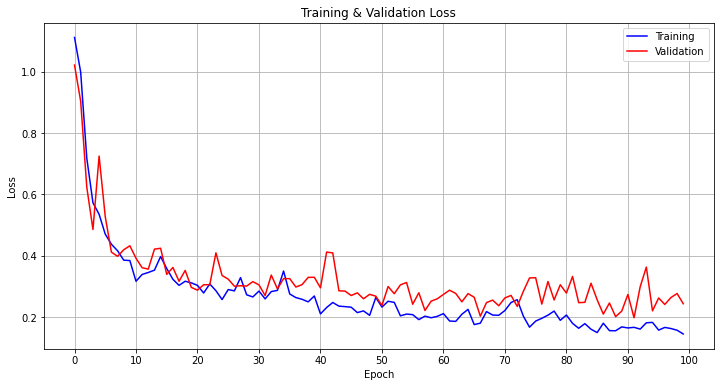

In [32]:
show_history(u_history)

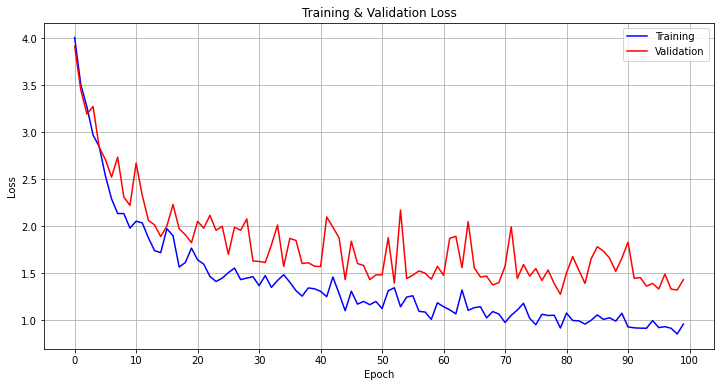

In [29]:
show_history(upp_history)

- U-Net과 U-Net++ 모델 모두 0~10 epoch 구간에서 빠르게 Loss가 감소하였다.
- 이후 50 epoch까지는 감소폭이 작지만 꾸준히 감소하는 경향을 보였으나, 50 epoch 쯤부터는 정체된 것을 볼 수 있다.
    - Training Loss가 꾸준히 감소하는 반면, Val Loss는 정체되었다.
    - 다만, 발산하지 않고 정체되었다는 점에서 학습률 조절을 통해 개선 가능성이 보인다.
    
- 두 모델 모두 40~50 epoch 쯤에서 제대로된 학습이 진행되지 않는다고 할 수 있다.

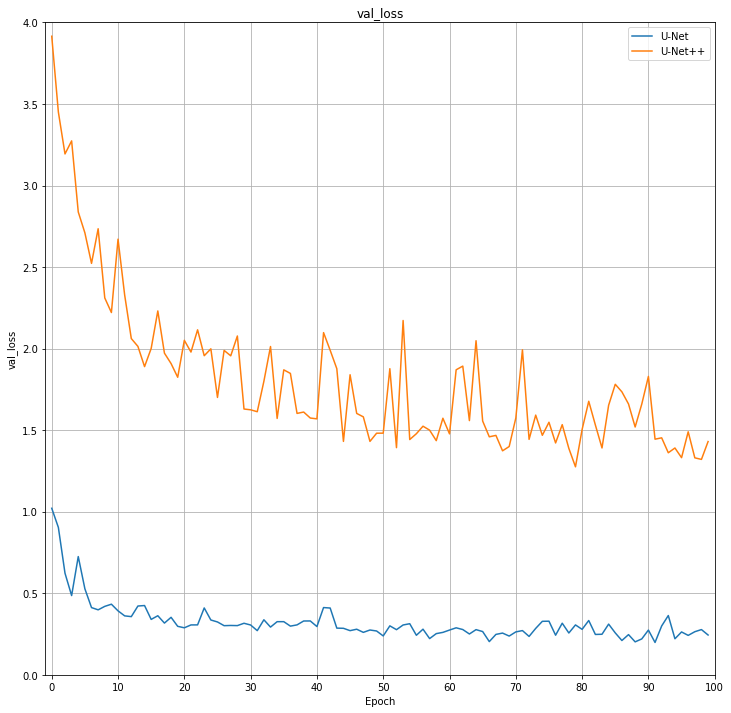

In [46]:
compare_history(history_list, focus='val_loss', y_lim=(0, 4))

- U-Net++가 비교적 큰 Loss값을 보이는데 이는 Deep Supervision적용으로 인해 4개 레이어의 출력값에 대한 Loss 합산 수치이기 때문이다.

- 해당 수치로는 공정한 비교가 불가하기 때문에 최종 레이어 출력에 대한 Loss만으로 비교해야겠다.

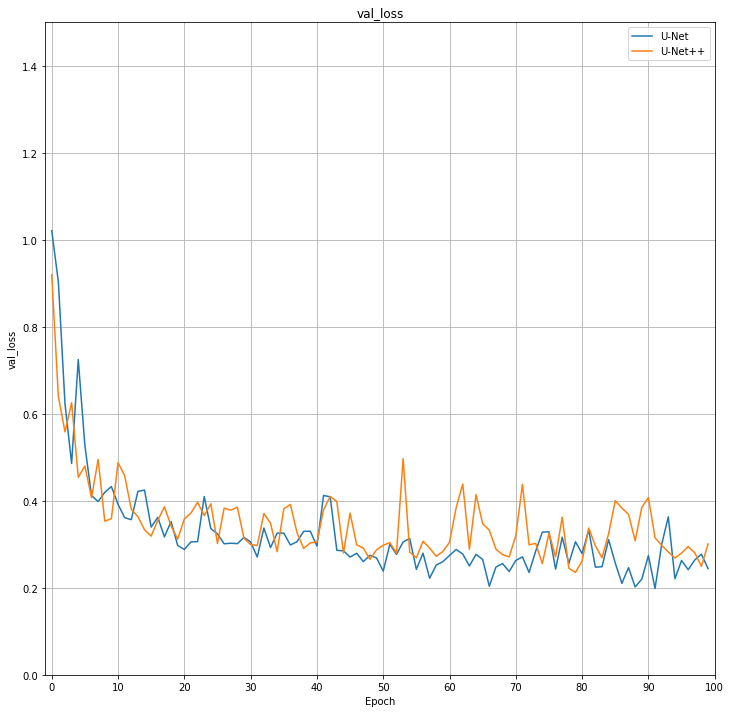

In [65]:
compare_history(history_list, focus='val_loss', y_lim=(0, 1.5), final_output=True)

- U-Net++의 최종 레이어 출력에 대한 Loss값으로만 비교해보니 수치가 유사한 경향을 보인다.

- 그러나 대체로 U-Net++가 다소 높은 Loss를 보이며 진동폭이 커 불안정한 모습을 보인다.

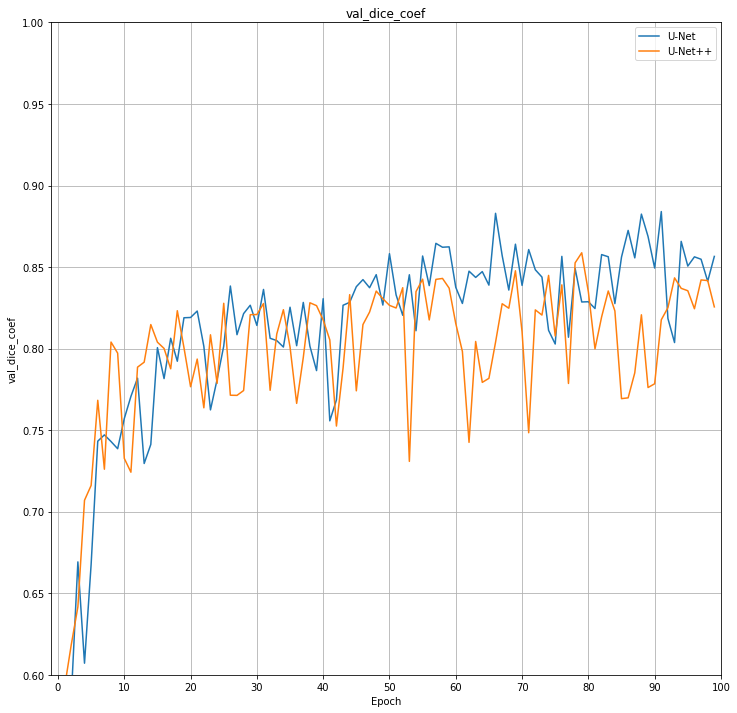

In [72]:
compare_history(history_list, focus='val_dice_coef', y_lim=(0.6, 1), final_output=True)

- Dice Coefficient 점수를 비교해보면 Val Loss때와 마찬가지로 U-Net++가 유사하지만 비교적 낮은 성능을 보이고 진동폭이 크다.

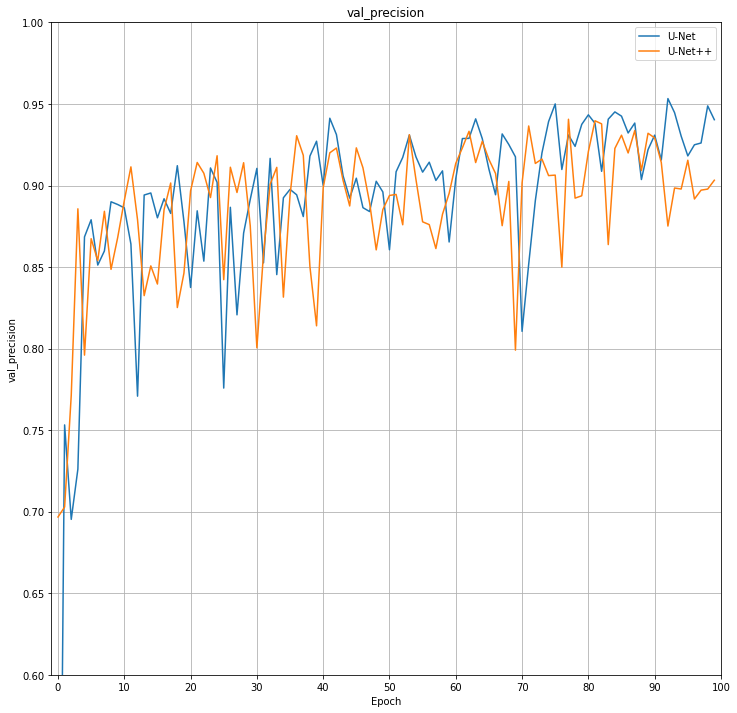

In [73]:
compare_history(history_list, focus='val_precision', y_lim=(0.6, 1), final_output=True)

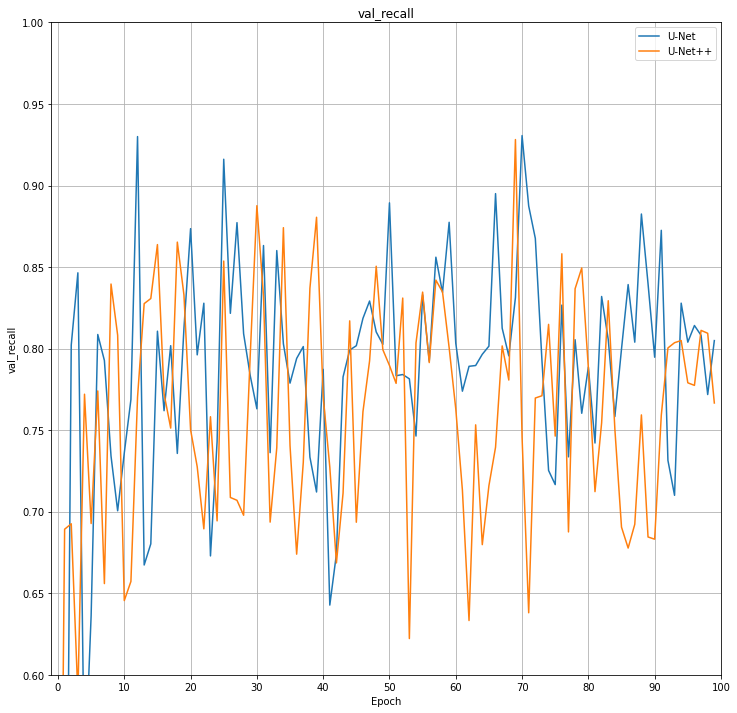

In [74]:
compare_history(history_list, focus='val_recall', y_lim=(0.6, 1), final_output=True)

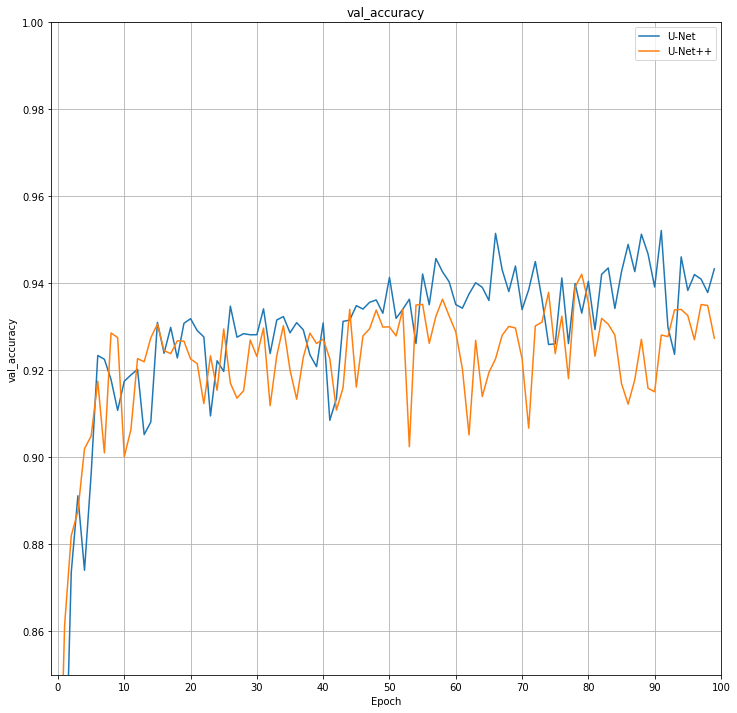

In [76]:
compare_history(history_list, focus='val_accuracy', y_lim=(0.85, 1), final_output=True)

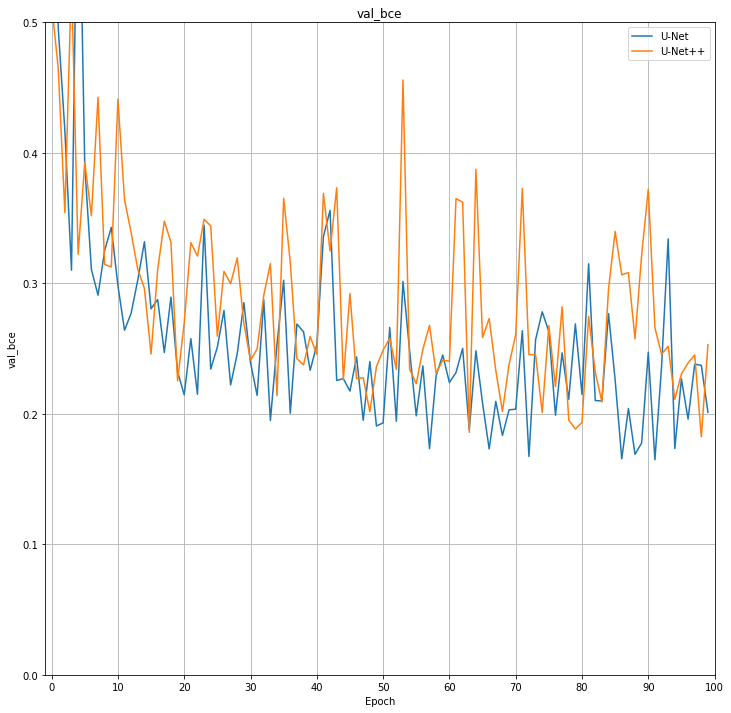

In [81]:
compare_history(history_list, focus='val_bce', y_lim=(0, 0.5), final_output=True)

- 선정한 지표들에서 모두 유사한 결과를 확인하였다.

- 두 모델이 비슷한 경향을 보이지만 U-Net++ 다소 낮은 성능을 보이고 진동폭이 커 불안정한 모습을 보였다.

- 또한, 두 모델 모두 50 epoch 이후 전혀 개선되지 않는 모습을 보여 학습이 제대로 이루어지지 않았다고 볼 수 있다.

- 20~50 epoch 구간에서도 개선폭이 아주 적기 때문에 충분히 학습되지 않은 모델들로 성능을 비교 분석하기에 다소 무리가 있어 보인다.

## ReduceLROnPlateau 적용 후 재학습

In [92]:
reduce_lr_on_plateau = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.5,         
    patience=5,         
    verbose=1,          
    min_lr=1e-5)

In [93]:
u_model = build_unet()

u_model.compile(optimizer=Adam(1e-4), loss=bce_dice_loss, 
                metrics=[MeanIoU(num_classes=2, name='iou'), 
                         dice_coef, Precision(name='precision'),
                         Recall(name='recall'), BinaryAccuracy(name='accuracy'),
                         tf.keras.losses.BinaryCrossentropy(
                             name='bce', from_logits=False)])

ckp = tf.keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(ckpt_path, 'UNet'+'_best.h5'),
    monitor='val_loss', save_best_only=True, verbose=1)

u_history2 = u_model.fit(
    train_generator, validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=70, callbacks=[ckp, reduce_lr_on_plateau])

Epoch 1/70
11/11 [==============================] - 22s 2s/step - loss: 1.0073 - iou: 0.3952 - dice_coef: 0.2871 - precision: 0.3178 - recall: 0.1649 - accuracy: 0.7509 - bce: 0.5889 - val_loss: 0.8557 - val_iou: 0.3849 - val_dice_coef: 0.3777 - val_precision: 0.7334 - val_recall: 0.4488 - val_accuracy: 0.8356 - val_bce: 0.4669

Epoch 00001: val_loss improved from inf to 0.85572, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNet_best.h5
Epoch 2/70
11/11 [==============================] - 10s 930ms/step - loss: 0.7271 - iou: 0.3907 - dice_coef: 0.5114 - precision: 0.5612 - recall: 0.7676 - accuracy: 0.8179 - bce: 0.4770 - val_loss: 0.8123 - val_iou: 0.3849 - val_dice_coef: 0.5375 - val_precision: 0.8004 - val_recall: 0.5519 - val_accuracy: 0.8652 - val_bce: 0.6996

Epoch 00002: val_loss improved from 0.85572 to 0.81230, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNet_best.h5
Epoch 3/70
11/11 [==============================] - 10s 931ms/step - loss: 0.6808 - i

Epoch 20/70
11/11 [==============================] - 16s 1s/step - loss: 0.2904 - iou: 0.3933 - dice_coef: 0.8225 - precision: 0.8117 - recall: 0.9032 - accuracy: 0.9347 - bce: 0.2257 - val_loss: 0.3852 - val_iou: 0.3849 - val_dice_coef: 0.7529 - val_precision: 0.9179 - val_recall: 0.6738 - val_accuracy: 0.9110 - val_bce: 0.2762

Epoch 00020: val_loss did not improve from 0.29407
Epoch 21/70
11/11 [==============================] - 11s 947ms/step - loss: 0.2644 - iou: 0.3845 - dice_coef: 0.8283 - precision: 0.8493 - recall: 0.8955 - accuracy: 0.9392 - bce: 0.1852 - val_loss: 0.2753 - val_iou: 0.3849 - val_dice_coef: 0.8251 - val_precision: 0.8522 - val_recall: 0.8592 - val_accuracy: 0.9333 - val_bce: 0.2008

Epoch 00021: val_loss improved from 0.29407 to 0.27532, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNet_best.h5
Epoch 22/70
11/11 [==============================] - 12s 1s/step - loss: 0.2663 - iou: 0.3901 - dice_coef: 0.8349 - precision: 0.8375 - recall: 0.8939 - ac

11/11 [==============================] - 14s 1s/step - loss: 0.2469 - iou: 0.4013 - dice_coef: 0.8388 - precision: 0.8421 - recall: 0.8939 - accuracy: 0.9459 - bce: 0.1712 - val_loss: 0.3031 - val_iou: 0.3849 - val_dice_coef: 0.8161 - val_precision: 0.9244 - val_recall: 0.7562 - val_accuracy: 0.9296 - val_bce: 0.2383

Epoch 00040: val_loss did not improve from 0.24656
Epoch 41/70
11/11 [==============================] - 12s 1s/step - loss: 0.2135 - iou: 0.3899 - dice_coef: 0.8598 - precision: 0.8731 - recall: 0.9092 - accuracy: 0.9509 - bce: 0.1466 - val_loss: 0.2512 - val_iou: 0.3849 - val_dice_coef: 0.8449 - val_precision: 0.9019 - val_recall: 0.8232 - val_accuracy: 0.9387 - val_bce: 0.1923

Epoch 00041: val_loss did not improve from 0.24656
Epoch 42/70
11/11 [==============================] - 11s 986ms/step - loss: 0.2310 - iou: 0.3935 - dice_coef: 0.8505 - precision: 0.8620 - recall: 0.8903 - accuracy: 0.9463 - bce: 0.1629 - val_loss: 0.2597 - val_iou: 0.3849 - val_dice_coef: 0.841


Epoch 00060: val_loss did not improve from 0.23769
Epoch 61/70
11/11 [==============================] - 13s 1s/step - loss: 0.1980 - iou: 0.3905 - dice_coef: 0.8696 - precision: 0.8873 - recall: 0.9040 - accuracy: 0.9537 - bce: 0.1352 - val_loss: 0.2482 - val_iou: 0.3852 - val_dice_coef: 0.8562 - val_precision: 0.9126 - val_recall: 0.8271 - val_accuracy: 0.9419 - val_bce: 0.2089

Epoch 00061: val_loss did not improve from 0.23769
Epoch 62/70
11/11 [==============================] - 12s 993ms/step - loss: 0.2163 - iou: 0.3934 - dice_coef: 0.8619 - precision: 0.8848 - recall: 0.8830 - accuracy: 0.9492 - bce: 0.1565 - val_loss: 0.2661 - val_iou: 0.3849 - val_dice_coef: 0.8388 - val_precision: 0.9267 - val_recall: 0.7913 - val_accuracy: 0.9375 - val_bce: 0.2098

Epoch 00062: val_loss did not improve from 0.23769
Epoch 63/70
11/11 [==============================] - 12s 1s/step - loss: 0.1998 - iou: 0.3893 - dice_coef: 0.8708 - precision: 0.8806 - recall: 0.9177 - accuracy: 0.9534 - bce: 0.

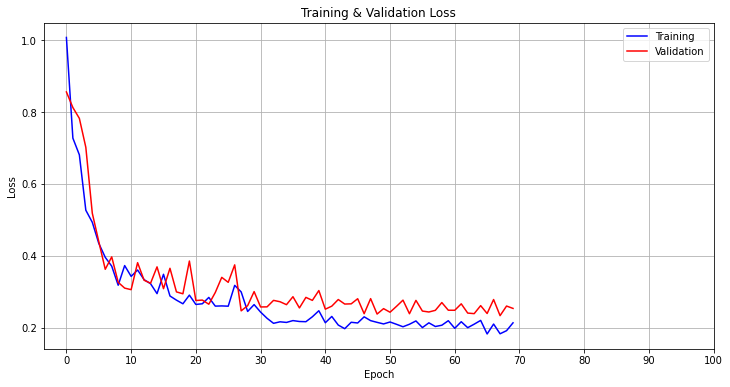

In [94]:
show_history(u_history2)

In [96]:
upp_model = build_unetpp(deep_supervision=True)

losses = {f"output_{i+1}": bce_dice_loss for i in range(4)}
upp_model.compile(optimizer=Adam(1e-4),
                  loss=losses,
                  metrics={
                      'output_4': [MeanIoU(num_classes=2, name='iou'),
                                   dice_coef,
                                   Precision(name='precision'),
                                   Recall(name='recall'),
                                   BinaryAccuracy(name='accuracy'),
                                   tf.keras.losses.BinaryCrossentropy(
                                       name='bce', from_logits=False)]})

ckp = tf.keras.callbacks.ModelCheckpoint(
    # filepath=os.path.join(ckpt_path, 'UNetPP_DSVon'+'_ep_{epoch}.h5'),
    filepath=os.path.join(ckpt_path, 'UNetPP_DSVon'+'_best.h5'),
    monitor='val_loss', save_best_only=True, verbose=1)

upp_history2 = upp_model.fit(
    train_generator, validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=70, callbacks=[ckp, reduce_lr_on_plateau])

Epoch 1/70
11/11 [==============================] - 35s 3s/step - loss: 4.0613 - output_1_loss: 1.0419 - output_2_loss: 1.0266 - output_3_loss: 1.0249 - output_4_loss: 0.9678 - output_4_iou: 0.3906 - output_4_dice_coef: 0.3213 - output_4_precision: 0.4703 - output_4_recall: 0.3444 - output_4_accuracy: 0.7718 - output_4_bce: 0.5782 - val_loss: 4.0163 - val_output_1_loss: 1.0154 - val_output_2_loss: 0.9959 - val_output_3_loss: 0.9905 - val_output_4_loss: 1.0145 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.3310 - val_output_4_precision: 0.8395 - val_output_4_recall: 0.2663 - val_output_4_accuracy: 0.8194 - val_output_4_bce: 0.6910

Epoch 00001: val_loss improved from inf to 4.01631, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNetPP_DSVon_best.h5
Epoch 2/70
11/11 [==============================] - 25s 2s/step - loss: 3.6070 - output_1_loss: 1.0213 - output_2_loss: 0.9725 - output_3_loss: 0.8835 - output_4_loss: 0.7297 - output_4_iou: 0.3943 - output_4_dice_coef: 0.


Epoch 00011: val_loss improved from 2.21158 to 2.17410, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNetPP_DSVon_best.h5
Epoch 12/70
11/11 [==============================] - 27s 2s/step - loss: 2.0667 - output_1_loss: 0.6814 - output_2_loss: 0.5728 - output_3_loss: 0.4480 - output_4_loss: 0.3645 - output_4_iou: 0.3911 - output_4_dice_coef: 0.7758 - output_4_precision: 0.8078 - output_4_recall: 0.8432 - output_4_accuracy: 0.9222 - output_4_bce: 0.2806 - val_loss: 2.0616 - val_output_1_loss: 0.7445 - val_output_2_loss: 0.5399 - val_output_3_loss: 0.4221 - val_output_4_loss: 0.3551 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.7740 - val_output_4_precision: 0.8498 - val_output_4_recall: 0.8321 - val_output_4_accuracy: 0.9275 - val_output_4_bce: 0.2581

Epoch 00012: val_loss improved from 2.17410 to 2.06162, saving model to /aiffel/aiffel/semantic_segmentation/ckpt/UNetPP_DSVon_best.h5
Epoch 13/70
11/11 [==============================] - 28s 2s/step - loss: 1.9374 -

11/11 [==============================] - 27s 2s/step - loss: 1.5859 - output_1_loss: 0.5408 - output_2_loss: 0.4515 - output_3_loss: 0.3149 - output_4_loss: 0.2787 - output_4_iou: 0.3900 - output_4_dice_coef: 0.8249 - output_4_precision: 0.8433 - output_4_recall: 0.8886 - output_4_accuracy: 0.9392 - output_4_bce: 0.2072 - val_loss: 1.9716 - val_output_1_loss: 0.6602 - val_output_2_loss: 0.5027 - val_output_3_loss: 0.4414 - val_output_4_loss: 0.3673 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.7821 - val_output_4_precision: 0.9017 - val_output_4_recall: 0.7236 - val_output_4_accuracy: 0.9182 - val_output_4_bce: 0.2989

Epoch 00023: val_loss did not improve from 1.89059
Epoch 24/70
11/11 [==============================] - 27s 2s/step - loss: 1.4855 - output_1_loss: 0.5367 - output_2_loss: 0.4021 - output_3_loss: 0.2929 - output_4_loss: 0.2539 - output_4_iou: 0.3955 - output_4_dice_coef: 0.8354 - output_4_precision: 0.8413 - output_4_recall: 0.9065 - output_4_accuracy: 0.9447 - 

11/11 [==============================] - 26s 2s/step - loss: 1.3871 - output_1_loss: 0.4921 - output_2_loss: 0.3635 - output_3_loss: 0.2839 - output_4_loss: 0.2477 - output_4_iou: 0.3894 - output_4_dice_coef: 0.8424 - output_4_precision: 0.8551 - output_4_recall: 0.8899 - output_4_accuracy: 0.9423 - output_4_bce: 0.1801 - val_loss: 1.7814 - val_output_1_loss: 0.6222 - val_output_2_loss: 0.4588 - val_output_3_loss: 0.3648 - val_output_4_loss: 0.3355 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.8063 - val_output_4_precision: 0.9018 - val_output_4_recall: 0.7586 - val_output_4_accuracy: 0.9254 - val_output_4_bce: 0.2837

Epoch 00034: val_loss did not improve from 1.63984
Epoch 35/70
11/11 [==============================] - 28s 2s/step - loss: 1.3232 - output_1_loss: 0.4850 - output_2_loss: 0.3451 - output_3_loss: 0.2613 - output_4_loss: 0.2318 - output_4_iou: 0.3908 - output_4_dice_coef: 0.8501 - output_4_precision: 0.8600 - output_4_recall: 0.9173 - output_4_accuracy: 0.9493 - 

11/11 [==============================] - 25s 2s/step - loss: 1.2603 - output_1_loss: 0.4650 - output_2_loss: 0.3268 - output_3_loss: 0.2474 - output_4_loss: 0.2210 - output_4_iou: 0.3954 - output_4_dice_coef: 0.8595 - output_4_precision: 0.8593 - output_4_recall: 0.9121 - output_4_accuracy: 0.9504 - output_4_bce: 0.1610 - val_loss: 2.0329 - val_output_1_loss: 0.6392 - val_output_2_loss: 0.5342 - val_output_3_loss: 0.4566 - val_output_4_loss: 0.4029 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.7729 - val_output_4_precision: 0.9259 - val_output_4_recall: 0.6837 - val_output_4_accuracy: 0.9146 - val_output_4_bce: 0.3517

Epoch 00045: val_loss did not improve from 1.57702
Epoch 46/70
11/11 [==============================] - 27s 2s/step - loss: 1.2407 - output_1_loss: 0.4589 - output_2_loss: 0.3229 - output_3_loss: 0.2414 - output_4_loss: 0.2175 - output_4_iou: 0.3904 - output_4_dice_coef: 0.8653 - output_4_precision: 0.8686 - output_4_recall: 0.9043 - output_4_accuracy: 0.9490 - 


Epoch 00056: val_loss did not improve from 1.57702
Epoch 57/70
11/11 [==============================] - 26s 2s/step - loss: 1.2782 - output_1_loss: 0.4563 - output_2_loss: 0.3342 - output_3_loss: 0.2586 - output_4_loss: 0.2291 - output_4_iou: 0.4001 - output_4_dice_coef: 0.8480 - output_4_precision: 0.8613 - output_4_recall: 0.8931 - output_4_accuracy: 0.9499 - output_4_bce: 0.1541 - val_loss: 1.6965 - val_output_1_loss: 0.5661 - val_output_2_loss: 0.4318 - val_output_3_loss: 0.3651 - val_output_4_loss: 0.3334 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.8037 - val_output_4_precision: 0.9053 - val_output_4_recall: 0.7419 - val_output_4_accuracy: 0.9227 - val_output_4_bce: 0.2743

Epoch 00057: val_loss did not improve from 1.57702
Epoch 58/70
11/11 [==============================] - 26s 2s/step - loss: 1.2539 - output_1_loss: 0.4520 - output_2_loss: 0.3250 - output_3_loss: 0.2542 - output_4_loss: 0.2227 - output_4_iou: 0.3958 - output_4_dice_coef: 0.8543 - output_4_precision:

11/11 [==============================] - 27s 2s/step - loss: 1.2533 - output_1_loss: 0.4629 - output_2_loss: 0.3310 - output_3_loss: 0.2464 - output_4_loss: 0.2130 - output_4_iou: 0.3948 - output_4_dice_coef: 0.8578 - output_4_precision: 0.8661 - output_4_recall: 0.9086 - output_4_accuracy: 0.9512 - output_4_bce: 0.1415 - val_loss: 1.7462 - val_output_1_loss: 0.5670 - val_output_2_loss: 0.4516 - val_output_3_loss: 0.3820 - val_output_4_loss: 0.3456 - val_output_4_iou: 0.3849 - val_output_4_dice_coef: 0.7959 - val_output_4_precision: 0.9209 - val_output_4_recall: 0.7225 - val_output_4_accuracy: 0.9218 - val_output_4_bce: 0.2830

Epoch 00068: val_loss did not improve from 1.52708
Epoch 69/70
11/11 [==============================] - 25s 2s/step - loss: 1.2761 - output_1_loss: 0.4599 - output_2_loss: 0.3285 - output_3_loss: 0.2571 - output_4_loss: 0.2305 - output_4_iou: 0.3952 - output_4_dice_coef: 0.8450 - output_4_precision: 0.8619 - output_4_recall: 0.8930 - output_4_accuracy: 0.9476 - 

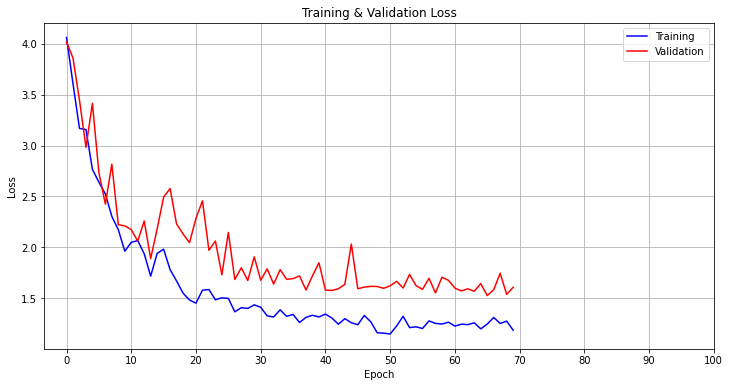

In [98]:
show_history(upp_history2)

In [100]:
history_list = [u_history2, upp_history2]

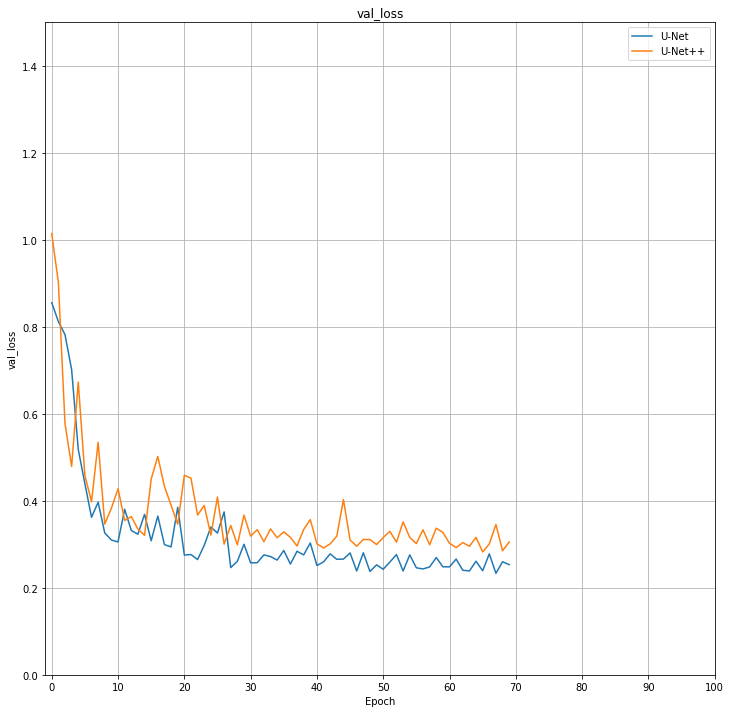

In [101]:
compare_history(history_list, focus='val_loss', y_lim=(0, 1.5), final_output=True)

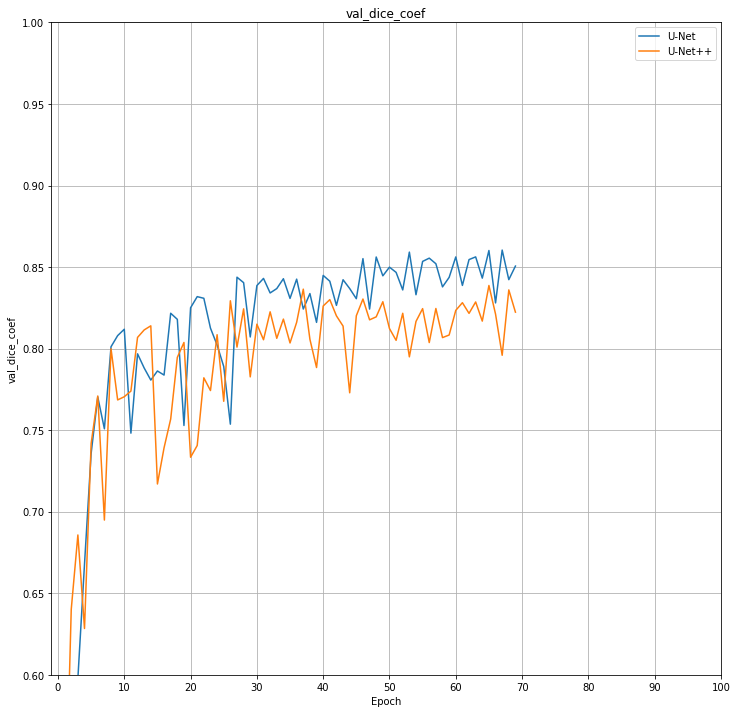

In [102]:
compare_history(history_list, focus='val_dice_coef', y_lim=(0.6, 1), final_output=True)

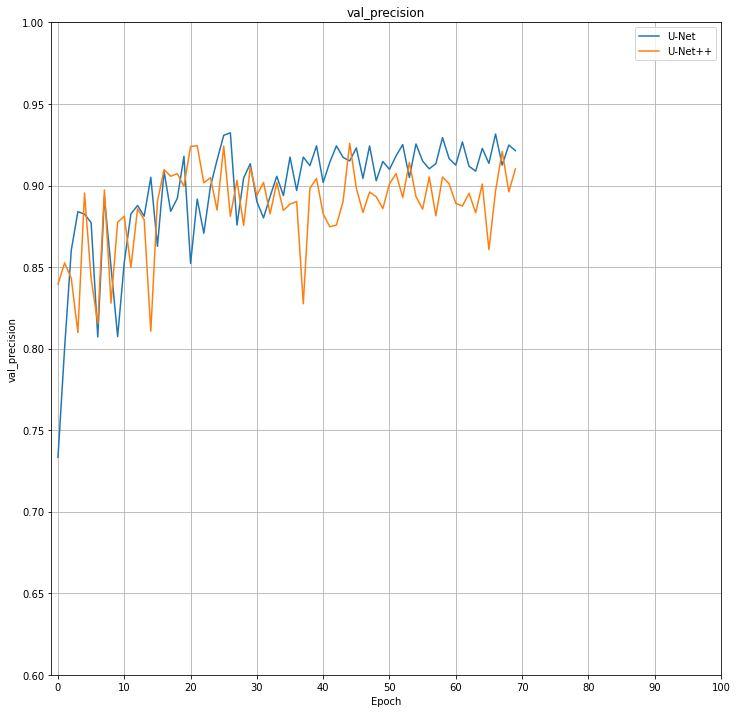

In [103]:
compare_history(history_list, focus='val_precision', y_lim=(0.6, 1), final_output=True)

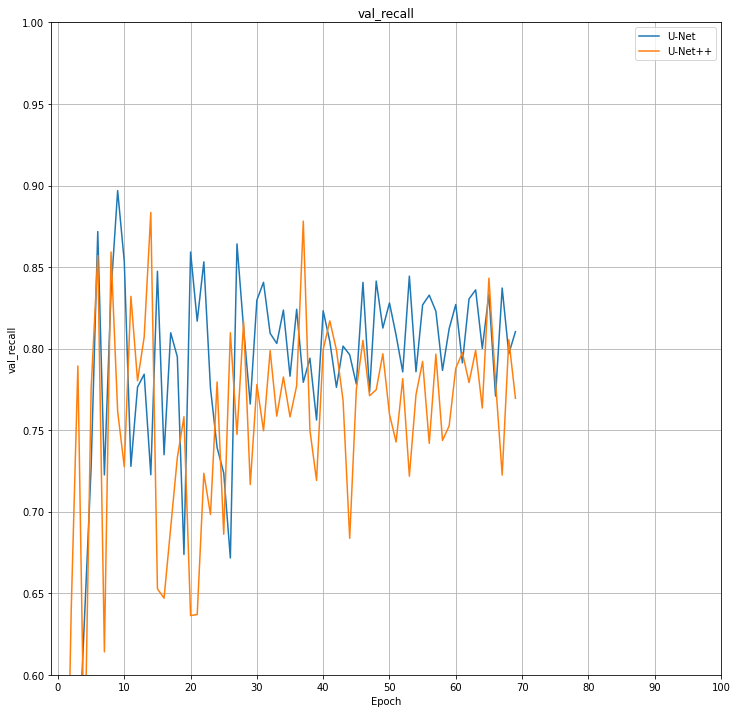

In [104]:
compare_history(history_list, focus='val_recall', y_lim=(0.6, 1), final_output=True)

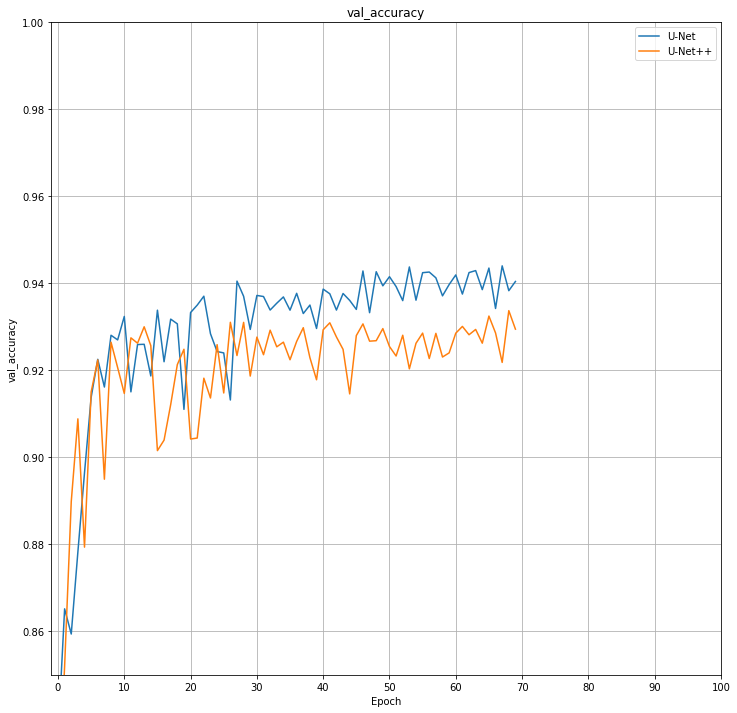

In [105]:
compare_history(history_list, focus='val_accuracy', y_lim=(0.85, 1), final_output=True)

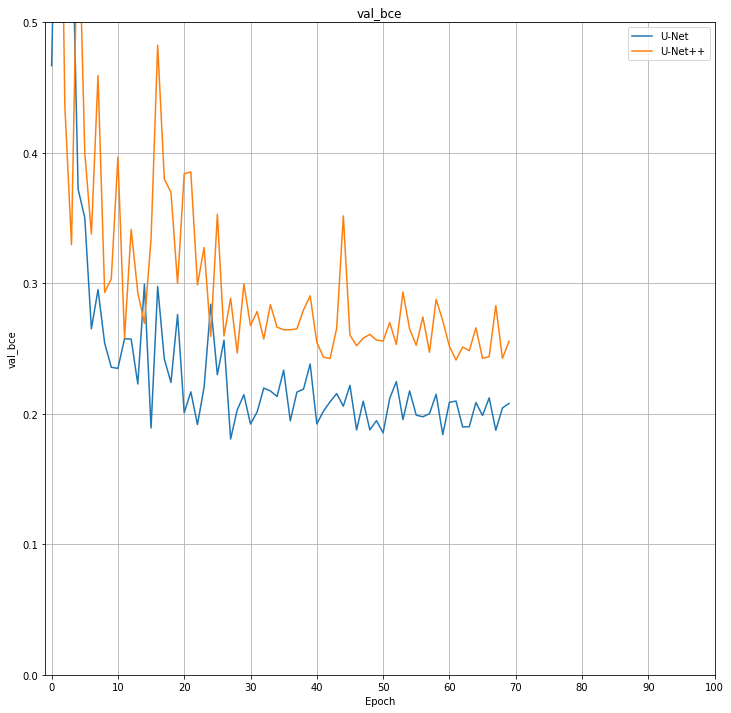

In [106]:
compare_history(history_list, focus='val_bce', y_lim=(0, 0.5), final_output=True)

- 진동폭이 좁아지긴 했지만 성능 자체가 개선되지는 않았다.

# Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석

- 실제 이미지 세그멘테이션 결과를 비교하여 어떤 차이가 있는지 확인해보고자 한다.

In [107]:
# u_model_path = './ckpt/UNet_baseline_best.h5'
# upp_model_path = './ckpt/UNetPP_DSVon_baseline_best.h5'

# u_model = tf.keras.models.load_model(u_model_path)
# upp_model = tf.keras.models.load_model(upp_model_path)

In [119]:
# Inference 전용 모델 호출
input_data = upp_model.get_layer('input_image').output
y_pred = upp_model.get_layer('output_4').output
upp_model_pred = Model(inputs=input_data, outputs=y_pred)

In [113]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

def calculate_iou_score(target, prediction):
    intersection = np.sum(prediction+target == 2) # intersection을 구하는 코드를 작성해주세요.
    union = intersection + np.sum(prediction+target == 1)# Union을 구하는 코드를 작성해주세요.
    iou_score = (intersection / union) if union else 1.0 # iou 스코어를 구하되 결과값을 float로 만들어주세요!
    print('IoU : %f' % iou_score )
    return iou_score

In [128]:
def compare_seg_result(i):
    model_list = [u_model, upp_model_pred]
    prev_iou = 0
    for model in model_list:
        print("U-Net 모델 결과:" if not prev_iou else "U-Net++ 모델 결과:")
        output, prediction, target = get_output(
            model, test_preproc,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png')
        iou = calculate_iou_score(target, prediction)
        if not prev_iou:
            prev_iou = iou
        else:
            print(f"U-Net모델 대비 {iou-prev_iou:.2f}%p 차이")
        print("="*77)

U-Net 모델 결과:


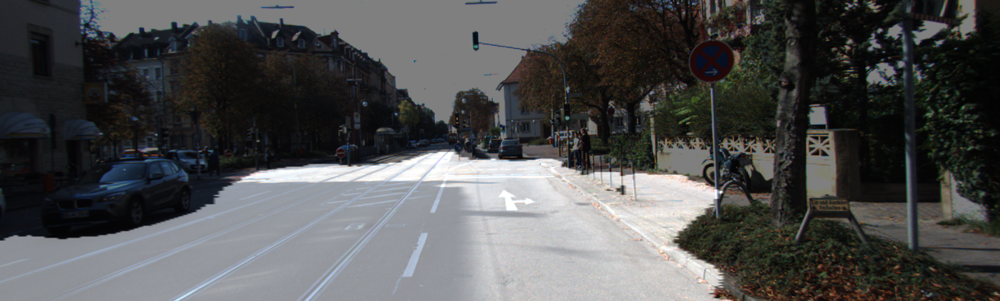

IoU : 0.853828
U-Net++ 모델 결과:


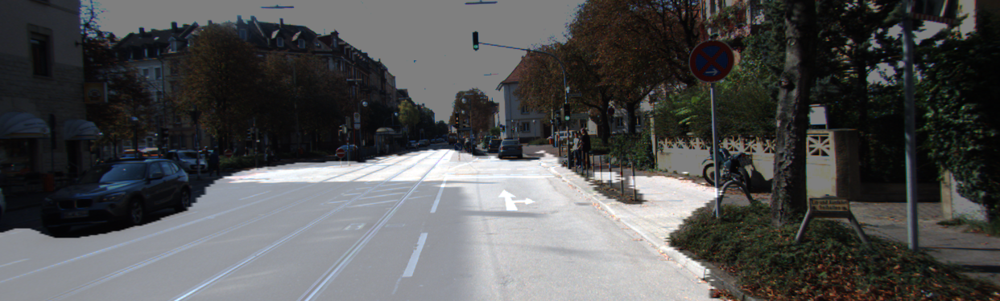

IoU : 0.884146
U-Net모델 대비 0.03%p 차이


In [129]:
compare_seg_result(1)

- U-Net이 인도 위 가로수 부분까지 도로로 인식한 것과 달리 U-Net++모델은 해당 부분은 구별하여 표기했다.

- IoU는 약 0.03%p 차이로 U-Net++모델이 더 좋은 결과를 보였다.

U-Net 모델 결과:


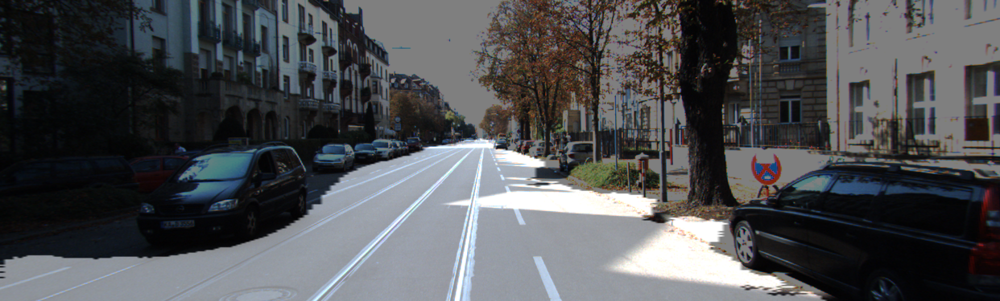

IoU : 0.870041
U-Net++ 모델 결과:


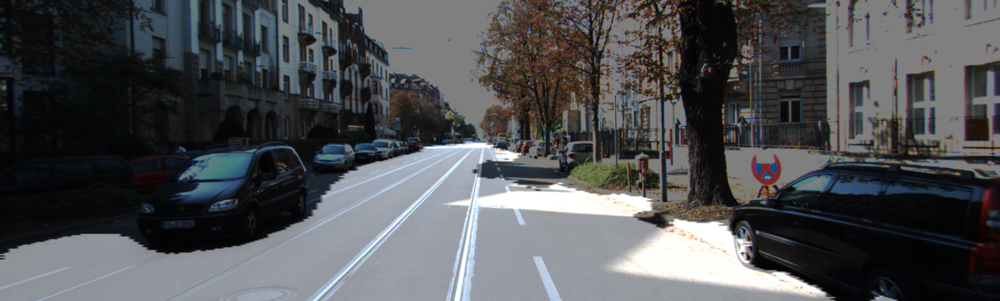

IoU : 0.883552
U-Net모델 대비 0.01%p 차이


In [130]:
compare_seg_result(0)

- 이미지 내 가장 좌측 차량 앞 그늘진 부분의 도로 부분을 U-Net++ 모델이 조금 더 잘 구분해낸 모습

- IoU에서 U-Net++ 모델이 다소 앞선 성능을 보임.

U-Net 모델 결과:


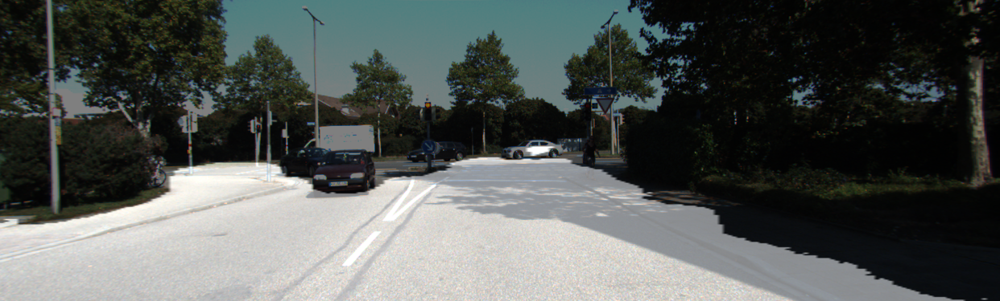

IoU : 0.784975
U-Net++ 모델 결과:


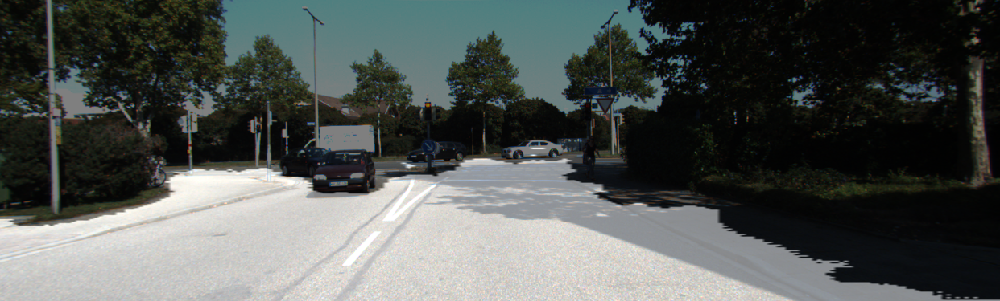

IoU : 0.804422
U-Net모델 대비 0.02%p 차이


In [136]:
compare_seg_result(7)

U-Net 모델 결과:


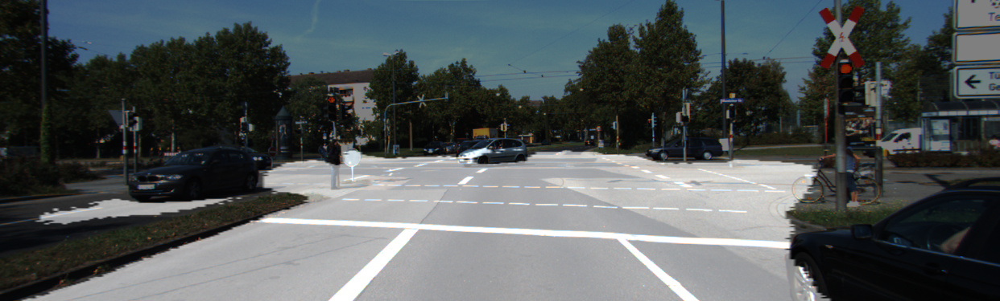

IoU : 0.846894
U-Net++ 모델 결과:


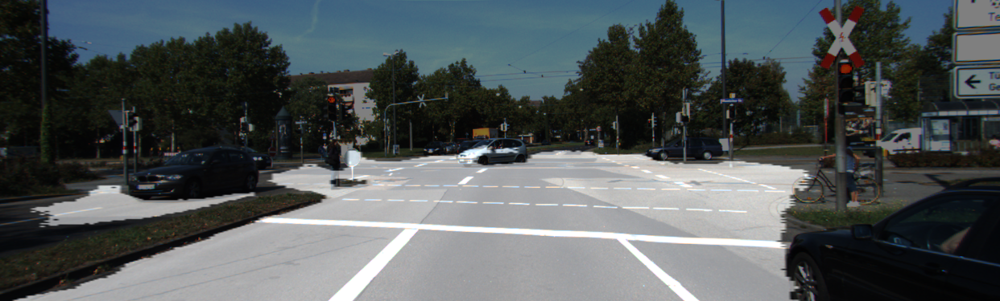

IoU : 0.868168
U-Net모델 대비 0.02%p 차이


In [143]:
compare_seg_result(13)

- 위 4장의 이미지를 미루어볼때, 장애물이 없이 뚫린 도로에서는 U-Net++ 모델이 좀 더 엣지부분을 구분을 잘 해내고 그 결과, 다소 높은 IoU 점수를 보인다.

U-Net 모델 결과:


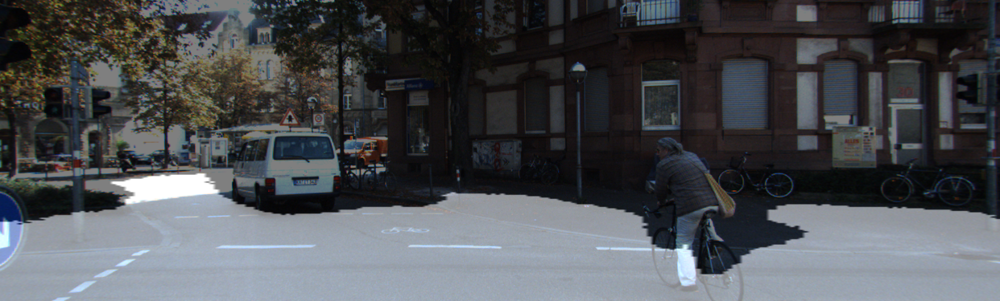

IoU : 0.691918
U-Net++ 모델 결과:


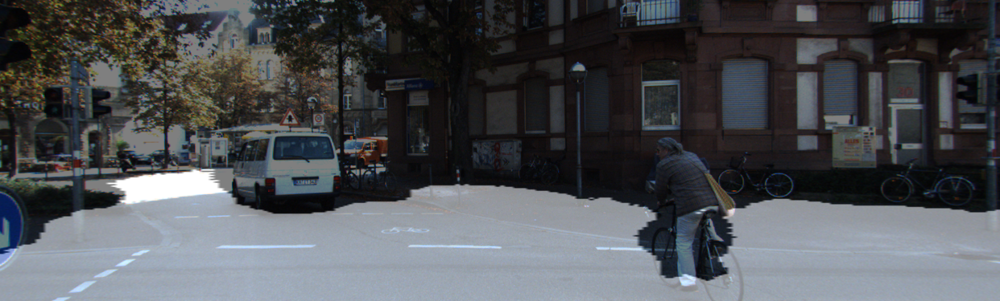

IoU : 0.679077
U-Net모델 대비 -0.01%p 차이


In [131]:
compare_seg_result(2)

- 사람 주변을 도로에서 제외하는 것은 U-Net++ 모델이 더 잘 하였으나 이미지 중앙 인도 위쪽을 U-Net 모델보다 더 넓게 오분류하며 IoU 점수도 약간 뒤쳐지는 모습.

U-Net 모델 결과:


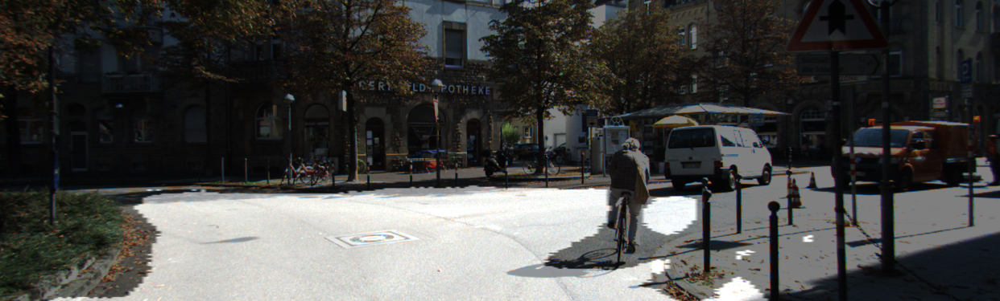

IoU : 0.755373
U-Net++ 모델 결과:


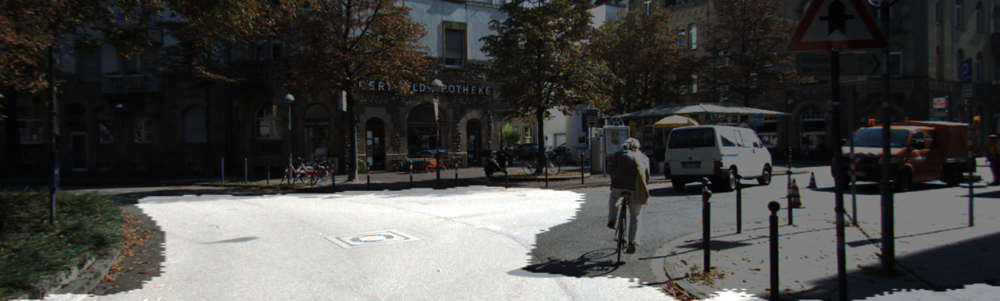

IoU : 0.652013
U-Net모델 대비 -0.10%p 차이


In [132]:
compare_seg_result(3)

U-Net 모델 결과:


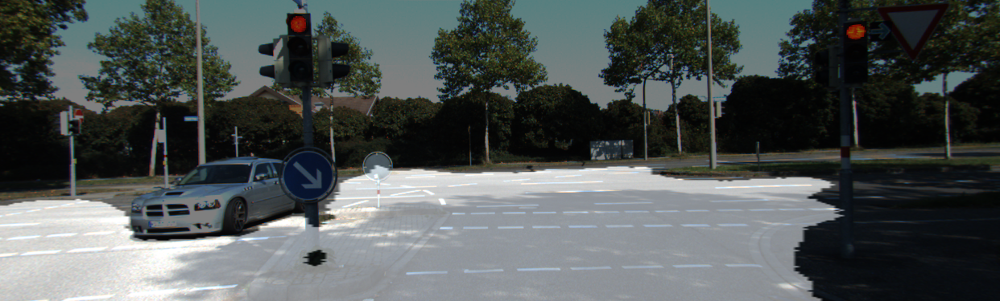

IoU : 0.754305
U-Net++ 모델 결과:


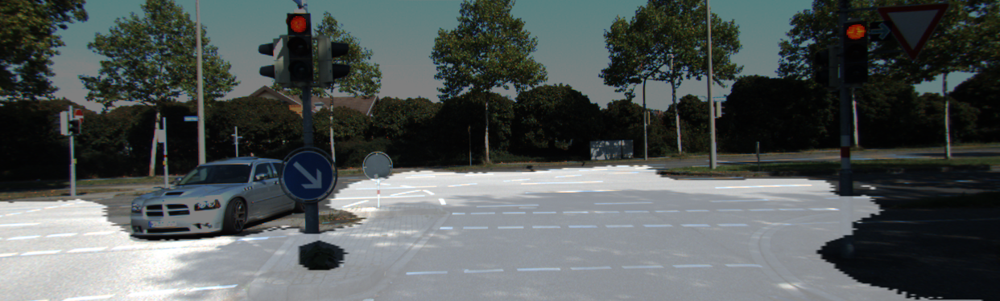

IoU : 0.732324
U-Net모델 대비 -0.02%p 차이


In [141]:
compare_seg_result(12)

- 그러나 위 3장의 이미지의 결과처럼 U-Net++ 모델은 장애물이 도로위에 등장하면 그 주변을 도로가 아닌 것으로 인식하는 경향을 보이며 그 결과 IoU 점수도 비교적 낮아지는 모습을 보인다.

U-Net 모델 결과:


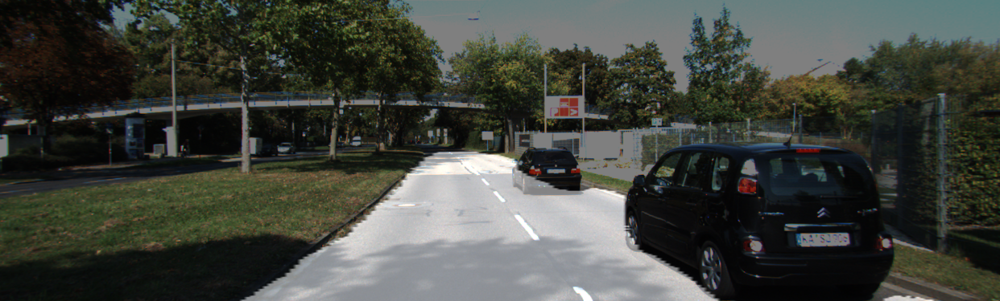

IoU : 0.825839
U-Net++ 모델 결과:


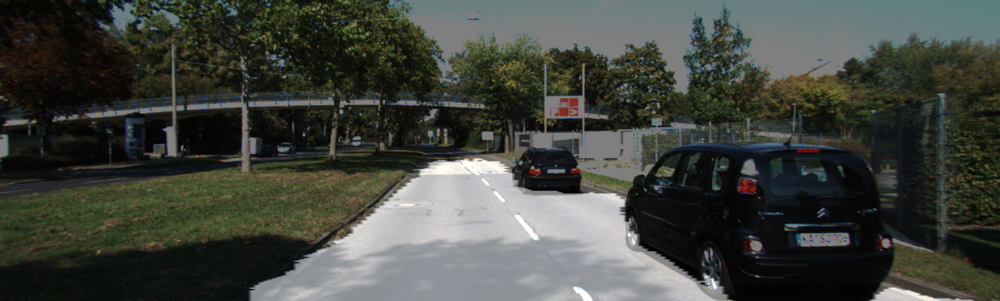

IoU : 0.821357
U-Net모델 대비 -0.00%p 차이


In [146]:
compare_seg_result(20)

- 해당 사진에서 IoU 점수는 거의 없으나, 앞의 차량의 범퍼 부분을 U-Net 모델의 경우는 일부 도로로 인식한 것을 확인할 수 있다.

U-Net 모델 결과:


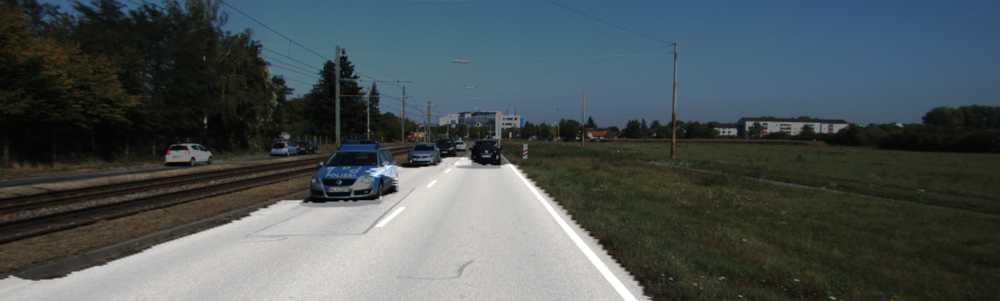

IoU : 0.886168
U-Net++ 모델 결과:


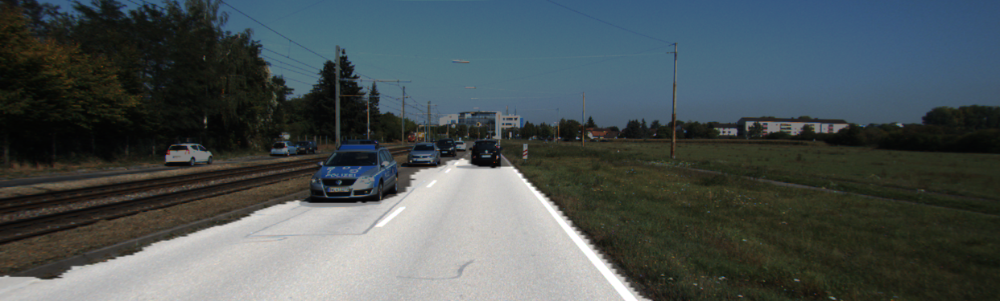

IoU : 0.893567
U-Net모델 대비 0.01%p 차이


In [148]:
compare_seg_result(40)

- 여기서도 U-Net은 차량의 일부분을 도로로 구분하였고 U-Net++는 차량 주변에 약간의 여백을 두고 구분한 모습.

## 결론

- 여러 평가지표를 보았을 때, U-Net++모델이 U-Net보다 성능이 떨어지는 모습을 보였다.

- 실제 시각화된 이미지를 보았을 때, U-Net++ 모델이 도로 위 장애물에 관하여 조금 더 보수적으로 도로가 아닌 것으로 추론한 결과를 확인할 수 있었다.

- 실제 자율 주행 차량에 적용한다고 가정할 때 안전을 위해 좀 더 보수적인 U-Net++ 모델을 선택하는 것이 나아보인다.
    - 단, 이 결론은 극히 일부 사례를 본 결과이기 때문에 보다 많은 사례에서 확인해봐야한다.

# 회고

- U-Net++모델이 학습 과정에서 Loss가 비교적 높게 나온다는 점과 모델이 더욱 복잡하다는 점을 미루어 볼 때, Nested Dense Skip Pathways를 통해 정규화와 유사한 효과를 보는 것은 아닌가 싶기도 하다.

- 실제 성능 지표로는 U-Net++모델 근소하게 뒤쳐지는 결과가 나왔지만 실제 이미지에서 Segmentation 결과 등을 보면서 데이터가 충분히 다양하고 많았다면 결과가 달라졌을 것 같다는 느낌을 받았다.

- 복잡한 모델을 논문을 보고 구현해보는 것은 너무 어려웠지만 그만큼 값진 경험이 되었으리라 믿는다.
    - 이 과정에서 구현의 부족함으로 인해 결과가 다소 안 좋게 나온 것은 아닌가 걱정이다.
    
- 복잡한 모델을 구현하고 또 각 모델을 비교하기 위한 성능 지표를 구현하고 적용하는 과정에서 많은 공부가 된 시간이었다.

---